# Project: Wrangling and Analyze Data

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.
1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [87]:
import pandas as pd
import requests 
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
# This file was already a csv so I read it in and wanted to see what was in it.

df = pd.read_csv('twitter-archive-enhanced.csv')
df.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [95]:
# Taking the given url and seeing what I'm working with.

url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'

response = requests.get(url)
response

# Grabbed the file and now need to put it in a folder in jupyter. Using 'wb' because I want to write the file in binary.

open("image_predictions.tsv", "wb").write(response.content)
response.content

b"tweet_id\tjpg_url\timg_num\tp1\tp1_conf\tp1_dog\tp2\tp2_conf\tp2_dog\tp3\tp3_conf\tp3_dog\n666020888022790149\thttps://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg\t1\tWelsh_springer_spaniel\t0.465074\tTrue\tcollie\t0.156665\tTrue\tShetland_sheepdog\t0.0614285\tTrue\n666029285002620928\thttps://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg\t1\tredbone\t0.506826\tTrue\tminiature_pinscher\t0.07419169999999999\tTrue\tRhodesian_ridgeback\t0.07201\tTrue\n666033412701032449\thttps://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg\t1\tGerman_shepherd\t0.596461\tTrue\tmalinois\t0.13858399999999998\tTrue\tbloodhound\t0.11619700000000001\tTrue\n666044226329800704\thttps://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg\t1\tRhodesian_ridgeback\t0.408143\tTrue\tredbone\t0.360687\tTrue\tminiature_pinscher\t0.222752\tTrue\n666049248165822465\thttps://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg\t1\tminiature_pinscher\t0.560311\tTrue\tRottweiler\t0.243682\tTrue\tDoberman\t0.154629\tTrue\n666050758794694657\thttps://pbs.twimg.com/

In [96]:
# Figuring out how to write the file and split the columns and convert to csv. 
# This took me entirley too long with a lot of googling.

image_pred = pd.read_csv('image_predictions.tsv',sep = '\t')

image_pred.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

   Note: I do not have any social media and did not want to use the Twitter API so I will be using the files provided by Udacity instead.

In [97]:
# Grabbing the twitter_api.py from the internet. This is just the code about how the tweet_json.txt works.

url = 'https://video.udacity-data.com/topher/2018/November/5be5fb4c_twitter-api/twitter-api.py'

response = requests.get(url)
response

<Response [200]>

In [98]:
# The file is now stored in Jupyter.

open("twitter_api.py", "wb").write(response.content)

1764

In [101]:
# Grabbing the tweet-json.txt file from the internet.

url = 'https://video.udacity-data.com/topher/2018/November/5be5fb7d_tweet-json/tweet-json.txt'

response = requests.get(url)
response

<Response [200]>

In [102]:
# Creating the file for tweet-json.txt file and storing it in Jupyter

open("tweet-json.txt", "wb").write(response.content)
response.content

b'{"created_at": "Tue Aug 01 16:23:56 +0000 2017", "id": 892420643555336193, "id_str": "892420643555336193", "full_text": "This is Phineas. He\'s a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", "truncated": false, "display_text_range": [0, 85], "entities": {"hashtags": [], "symbols": [], "user_mentions": [], "urls": [], "media": [{"id": 892420639486877696, "id_str": "892420639486877696", "indices": [86, 109], "media_url": "http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "media_url_https": "https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "url": "https://t.co/MgUWQ76dJU", "display_url": "pic.twitter.com/MgUWQ76dJU", "expanded_url": "https://twitter.com/dog_rates/status/892420643555336193/photo/1", "type": "photo", "sizes": {"large": {"w": 540, "h": 528, "resize": "fit"}, "thumb": {"w": 150, "h": 150, "resize": "crop"}, "small": {"w": 540, "h": 528, "resize": "fit"}, "medium": {"w": 540, "h": 528, "resize": "fit"}}}]}, "extended_entities": {"me

In [103]:
# Creating a dataframe in pandas to store tweet-json.txt. 'lines=True' to read in the file line by line. Telling the dataframe
# what columns I want to display.

tweet_df = pd.read_json('tweet-json.txt', lines=True)[['id', 'retweeted_status', 'retweet_count', 'full_text', 'favorite_count', 'display_text_range', 'created_at']]
tweet_df.sample(8)

,id,retweeted_status,retweet_count,full_text,favorite_count,display_text_range,created_at
838,767122157629476866,NaN,3261,This is Rupert. You betrayed him with bath tim...,11227,"[0, 84]",2016-08-20 22:12:29
1518,690728923253055490,NaN,597,This is Vinscent. He was just questioned about...,2384,"[0, 108]",2016-01-23 02:53:03
2195,668826086256599040,NaN,150,This is Banditt. He is a brown LaBeouf retriev...,467,"[0, 139]",2015-11-23 16:18:59
162,860276583193509888,NaN,3745,This is Jordy. He likes to go on adventures an...,19154,"[0, 131]",2017-05-04 23:34:55
2098,670704688707301377,NaN,405,Meet Danny. He's too good to look at the road ...,814,"[0, 135]",2015-11-28 20:43:53
248,845306882940190720,NaN,6039,This is Pickles. She's a silly pupper. Thinks ...,25225,"[0, 75]",2017-03-24 16:10:40
429,821044531881721856,NaN,2636,This is Flash. He went way too hard celebratin...,14021,"[0, 125]",2017-01-16 17:20:45
1039,743980027717509120,NaN,1231,This is Geno. He's a Wrinkled Baklavian Velvee...,4551,"[0, 115]",2016-06-18 01:33:55


## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



# Assessing Data 
>
> To keep things organized I will be displaying the assesment of each table below.
>
>
### Quality Issues
>
> <b>df table</b>
>
> - Timestamp column should be datetime data type.
>
> - Combine the columns 'doggo', 'floofer', 'pupper' and 'puppo' into one column called, "Dog Rating".
>
> - Drop Columns that are not needed. 
>
> <b>image_pred</b>
>
> - Column headers need to be more consitent and descriptive.
> 
> - Collect all non-dog breed predictions and drop them.
> 
> - Standardize all dog names in 'Breed Prediction 1/2/3'. Capitalize first letters and remove underscores.
>
> - Drop duplicates in jpg_urls column.
>
> - Drop the last 7 columns, they are not needed. We only need to know what dog breed the algorithm was most confident in.
>
> <b>tweet_df</b>
>
> - The 'retweeted_status' column tells us that those are the tweets that are retweeted, the ones without 'NaaN' values need to go. 
>
> - Drop 'retweeted_status' column as it is not necessary.
>
> - Renaming 'id' column to 'tweet_id'.
>
>
### Tidiness issues
> 
> - Merge all of the tables into one master dataframe.
> 
> - Dropping columns that are not needed, renaming columns, as well as combining columns (all referred to above).

# Assessing df.

In [104]:
# Visually inspecting the twitter-archived-enhanced.csv file

df.sample(20)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
959,751251247299190784,NaN,NaN,2016-07-08 03:07:09 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Gilbert. He's being chased by a battal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/751251247...,10,10,Gilbert,None,None,None,None
291,838085839343206401,8.380855e+17,2.894131e+09,2017-03-04 17:56:49 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@bragg6of8 @Andy_Pace_ we are still looking fo...,NaN,NaN,NaN,NaN,15,10,None,None,None,None,None
668,790277117346975746,NaN,NaN,2016-10-23 19:42:02 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Bruce. He never backs down from a chal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/790277117...,11,10,Bruce,None,None,None,None
258,843604394117681152,NaN,NaN,2017-03-19 23:25:35 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Hank. He's been outside for 3 minutes ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/843604394...,11,10,Hank,None,None,None,None
1318,706538006853918722,NaN,NaN,2016-03-06 17:52:42 +0000,"<a href=""http://twitter.com/download/iphone"" r...","This is Oliver (pronounced ""Ricardo""). He's a ...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/706538006...,11,10,Oliver,None,None,None,None
2339,666102155909144576,NaN,NaN,2015-11-16 03:55:04 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Oh my. Here you are seeing an Adobe Setter giv...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666102155...,11,10,None,None,None,None,None
1577,687399393394311168,NaN,NaN,2016-01-13 22:22:41 +0000,"<a href=""http://vine.co"" rel=""nofollow"">Vine -...",This is Barry. He's very fast. I hope he finds...,NaN,NaN,NaN,https://vine.co/v/iM2hLu9LU5i,10,10,Barry,None,None,None,None
632,793962221541933056,NaN,NaN,2016-11-02 23:45:19 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Maximus. His face is stuck like that. ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/793962221...,12,10,Maximus,None,None,None,None
1964,673350198937153538,NaN,NaN,2015-12-06 03:56:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Bella. She's a Genghis Flopped Canuck....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/673350198...,9,10,Bella,None,None,None,None
486,814530161257443328,NaN,NaN,2016-12-29 17:54:58 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Alf. Someone just rubbed a balloon on ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/814530161...,12,10,Alf,None,None,None,None


In [105]:
# Checking data types in df.

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

In [106]:
# Checking to see if there are any duplicates in tweet_id.

df.tweet_id.duplicated().sum()

0

# Assessing image_pred

In [107]:
# Programatically assessing the image_predictions.tsv file.

image_pred.sample(10)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
592,679462823135686656,https://pbs.twimg.com/media/CW3v1KxW8AAIOuy.jpg,1,toy_poodle,0.621780,True,miniature_poodle,0.197819,True,soft-coated_wheaten_terrier,0.046745,True
1242,747204161125646336,https://pbs.twimg.com/media/Cl6aOBhWEAALuti.jpg,2,coil,0.533699,False,dugong,0.087959,False,rain_barrel,0.039221,False
177,669214165781868544,https://pbs.twimg.com/media/CUmGu7-UcAA0r3O.jpg,1,minivan,0.435396,False,police_van,0.310143,False,minibus,0.068201,False
1587,798209839306514432,https://pbs.twimg.com/media/CxPPnCYWIAAo_ao.jpg,1,Pekinese,0.524583,True,Shih-Tzu,0.102931,True,Pomeranian,0.097893,True
1908,852672615818899456,https://pbs.twimg.com/media/C9VNNp1XkAEWRFb.jpg,1,golden_retriever,0.711235,True,otterhound,0.068235,True,Sussex_spaniel,0.046562,True
1663,812372279581671427,https://pbs.twimg.com/media/C0YgO3DW8AAz98O.jpg,2,golden_retriever,0.784873,True,cocker_spaniel,0.087788,True,Labrador_retriever,0.083275,True
970,706538006853918722,https://pbs.twimg.com/media/Cc4gjxqW4AIoThO.jpg,1,chow,0.541794,True,Pembroke,0.094918,True,Pomeranian,0.085439,True
1182,738402415918125056,https://pbs.twimg.com/media/Cj9VEs_XAAAlTai.jpg,1,cocker_spaniel,0.346695,True,Blenheim_spaniel,0.193905,True,Chihuahua,0.078000,True
1068,715928423106027520,https://pbs.twimg.com/media/Ce99GhLW8AAHG38.jpg,1,pug,0.976685,True,French_bulldog,0.019663,True,bull_mastiff,0.002278,True
292,671186162933985280,https://pbs.twimg.com/media/CVCIQX7UkAEzqh_.jpg,1,Chihuahua,0.319106,True,whippet,0.169134,True,toy_terrier,0.125815,True


In [108]:
# Grabbing data types on image_pred

image_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [109]:
# Checking to see if any tweet_id are the same.

image_pred.tweet_id.duplicated().sum()

0

In [110]:
# Finding how many duplicates are in the jpg_url column.

image_pred.jpg_url.duplicated().sum()

66

In [111]:
# displaying all of the duplicated jpg urls in the jpg_url column.

image_pred[image_pred['jpg_url'].duplicated() == True]

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
1297,752309394570878976,https://pbs.twimg.com/ext_tw_video_thumb/67535...,1,upright,0.303415,False,golden_retriever,0.181351,True,Brittany_spaniel,0.162084,True
1315,754874841593970688,https://pbs.twimg.com/media/CWza7kpWcAAdYLc.jpg,1,pug,0.272205,True,bull_mastiff,0.251530,True,bath_towel,0.116806,False
1333,757729163776290825,https://pbs.twimg.com/media/CWyD2HGUYAQ1Xa7.jpg,2,cash_machine,0.802333,False,schipperke,0.045519,True,German_shepherd,0.023353,True
1345,759159934323924993,https://pbs.twimg.com/media/CU1zsMSUAAAS0qW.jpg,1,Irish_terrier,0.254856,True,briard,0.227716,True,soft-coated_wheaten_terrier,0.223263,True
1349,759566828574212096,https://pbs.twimg.com/media/CkNjahBXAAQ2kWo.jpg,1,Labrador_retriever,0.967397,True,golden_retriever,0.016641,True,ice_bear,0.014858,False
1364,761371037149827077,https://pbs.twimg.com/tweet_video_thumb/CeBym7...,1,brown_bear,0.713293,False,Indian_elephant,0.172844,False,water_buffalo,0.038902,False
1368,761750502866649088,https://pbs.twimg.com/media/CYLDikFWEAAIy1y.jpg,1,golden_retriever,0.586937,True,Labrador_retriever,0.398260,True,kuvasz,0.005410,True
1387,766078092750233600,https://pbs.twimg.com/media/ChK1tdBWwAQ1flD.jpg,1,toy_poodle,0.420463,True,miniature_poodle,0.132640,True,Chesapeake_Bay_retriever,0.121523,True
1407,770093767776997377,https://pbs.twimg.com/media/CkjMx99UoAM2B1a.jpg,1,golden_retriever,0.843799,True,Labrador_retriever,0.052956,True,kelpie,0.035711,True
1417,771171053431250945,https://pbs.twimg.com/media/CVgdFjNWEAAxmbq.jpg,3,Samoyed,0.978833,True,Pomeranian,0.012763,True,Eskimo_dog,0.001853,True


In [112]:
# Finding all dog breeds in 'p1' column.

image_pred['p1'].value_counts()

golden_retriever             150
Labrador_retriever           100
Pembroke                      89
Chihuahua                     83
pug                           57
chow                          44
Samoyed                       43
toy_poodle                    39
Pomeranian                    38
cocker_spaniel                30
malamute                      30
French_bulldog                26
miniature_pinscher            23
Chesapeake_Bay_retriever      23
seat_belt                     22
German_shepherd               20
Siberian_husky                20
Staffordshire_bullterrier     20
Cardigan                      19
web_site                      19
Shetland_sheepdog             18
beagle                        18
Maltese_dog                   18
Eskimo_dog                    18
teddy                         18
Rottweiler                    17
Lakeland_terrier              17
Shih-Tzu                      17
kuvasz                        16
Italian_greyhound             16
          

In [113]:
# Finding all dog breeds in 'p2' column.

image_pred['p2'].value_counts()

Labrador_retriever                104
golden_retriever                   92
Cardigan                           73
Chihuahua                          44
Pomeranian                         42
French_bulldog                     41
Chesapeake_Bay_retriever           41
toy_poodle                         37
cocker_spaniel                     34
Siberian_husky                     33
miniature_poodle                   33
beagle                             28
collie                             27
Eskimo_dog                         27
Pembroke                           27
kuvasz                             26
Italian_greyhound                  22
Pekinese                           21
American_Staffordshire_terrier     21
toy_terrier                        20
Samoyed                            20
malinois                           20
chow                               20
miniature_pinscher                 20
Boston_bull                        19
Norwegian_elkhound                 19
Staffordshir

In [114]:
# Finding all dog breeds in the 'p3' column.

image_pred['p3'].value_counts()

Labrador_retriever                79
Chihuahua                         58
golden_retriever                  48
Eskimo_dog                        38
kelpie                            35
kuvasz                            34
Staffordshire_bullterrier         32
chow                              32
beagle                            31
cocker_spaniel                    31
toy_poodle                        29
Pekinese                          29
Pomeranian                        29
Great_Pyrenees                    27
Pembroke                          27
Chesapeake_Bay_retriever          27
French_bulldog                    26
malamute                          26
American_Staffordshire_terrier    24
pug                               23
Cardigan                          23
basenji                           21
bull_mastiff                      20
toy_terrier                       20
Siberian_husky                    19
Boston_bull                       17
Shetland_sheepdog                 17
b

# Assessing tweet_df

In [115]:
# Assessing a sample of tweet_df.

tweet_df

,id,retweeted_status,retweet_count,full_text,favorite_count,display_text_range,created_at
0,892420643555336193,NaN,8853,This is Phineas. He's a mystical boy. Only eve...,39467,"[0, 85]",2017-08-01 16:23:56
1,892177421306343426,NaN,6514,This is Tilly. She's just checking pup on you....,33819,"[0, 138]",2017-08-01 00:17:27
2,891815181378084864,NaN,4328,This is Archie. He is a rare Norwegian Pouncin...,25461,"[0, 121]",2017-07-31 00:18:03
3,891689557279858688,NaN,8964,This is Darla. She commenced a snooze mid meal...,42908,"[0, 79]",2017-07-30 15:58:51
4,891327558926688256,NaN,9774,This is Franklin. He would like you to stop ca...,41048,"[0, 138]",2017-07-29 16:00:24
5,891087950875897856,NaN,3261,Here we have a majestic great white breaching ...,20562,"[0, 138]",2017-07-29 00:08:17
6,890971913173991426,NaN,2158,Meet Jax. He enjoys ice cream so much he gets ...,12041,"[0, 140]",2017-07-28 16:27:12
7,890729181411237888,NaN,16716,When you watch your owner call another dog a g...,56848,"[0, 118]",2017-07-28 00:22:40
8,890609185150312448,NaN,4429,This is Zoey. She doesn't want to be one of th...,28226,"[0, 122]",2017-07-27 16:25:51
9,890240255349198849,NaN,7711,This is Cassie. She is a college pup. Studying...,32467,"[0, 133]",2017-07-26 15:59:51


In [116]:
# Checking all data type in tweet_df.

print(tweet_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 7 columns):
id                    2354 non-null int64
retweeted_status      179 non-null object
retweet_count         2354 non-null int64
full_text             2354 non-null object
favorite_count        2354 non-null int64
display_text_range    2354 non-null object
created_at            2354 non-null datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 128.8+ KB
None


In [117]:
# Finding how many 'NaaN' values are in retweeted_status.

tweet_df['retweeted_status'].isnull().sum()

2175

# Cleaning Data

## Cleaning df

In [118]:
# Making a copy of the orginal data as not to mess with it. Naming the copy 'tweet archive'.

tweet_archive = df.copy()
tweet_archive.sample(5)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
1729,679862121895714818,NaN,NaN,2015-12-24 03:12:15 +0000,"<a href=""http://twitter.com/download/iphone"" r...","""Dammit hooman I'm jus trynna lik the fler"" 11...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/679862121...,11,10,None,None,None,None,None
1709,680609293079592961,NaN,NaN,2015-12-26 04:41:15 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Brody. That is his chair. He loves his...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/680609293...,9,10,Brody,None,None,None,None
1164,723179728551723008,NaN,NaN,2016-04-21 16:00:57 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Jangle. She's addicted to broccoli. It...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/723179728...,8,10,Jangle,None,None,None,None
1354,703631701117943808,NaN,NaN,2016-02-27 17:24:05 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Bella. Based on this picture she's at ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/703631701...,11,10,Bella,None,None,None,None
129,867421006826221569,NaN,NaN,2017-05-24 16:44:18 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Shikha. She just watched you drop a sk...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/867421006...,12,10,Shikha,None,None,None,puppo


### Issue #1: Timestamp column should be datetime data type

In [119]:
tweet_archive["timestamp"] =  pd.to_datetime(tweet_archive["timestamp"], format="%Y/%m/%d")
tweet_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null datetime64[ns]
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: datetime64[ns](1

### Issue #2: Combine the columns 'doggo', 'floofer', 'pupper' and 'puppo' into one column called, "Dog Rating"

> There is a brilliant article about how to use melt in the link below.
>
> https://towardsdatascience.com/wide-to-long-data-how-and-when-to-use-pandas-melt-stack-and-wide-to-long-7c1e0f462a98

In [120]:
# Creating a list (leave_columns) of columns that I don't want touched during the melt() function.
# These are the identifier variables.

leave_columns = ['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp', 'source', 'text', 'retweeted_status_id',
                    'retweeted_status_timestamp', 'retweeted_status_user_id', 'expanded_urls', 'rating_numerator', 'rating_denominator',
                        'name']

# Creating a list of columns that will be stacked into a single column.

stack_columns = ['doggo', 'floofer', 'pupper', 'puppo']


# Passing in the lists created above for the melt() function.
# Because there is no inplace parameter for melt(), I'll be renaming it to keep it in place.

tweet_archive2 = tweet_archive.melt(id_vars=leave_columns, value_vars=stack_columns, var_name='Dog Rating')
tweet_archive2.sample(5)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_timestamp,retweeted_status_user_id,expanded_urls,rating_numerator,rating_denominator,name,Dog Rating,value
8511,696744641916489729,NaN,NaN,2016-02-08 17:17:22,"<a href=""http://vine.co"" rel=""nofollow"">Vine -...",This is Klevin. He doesn't want his family bra...,NaN,NaN,NaN,https://vine.co/v/i1wrljBUjAu,10,10,Klevin,puppo,None
784,775096608509886464,NaN,NaN,2016-09-11 22:20:06,"<a href=""http://twitter.com/download/iphone"" r...","RT @dog_rates: After so many requests, this is...",7.403732e+17,2016-06-08 02:41:38 +0000,4.196984e+09,https://twitter.com/dog_rates/status/740373189...,9,11,None,doggo,None
4956,846042936437604353,NaN,NaN,2017-03-26 16:55:29,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jarvis. The snow pupsets him. Officially ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/846042936...,12,10,Jarvis,pupper,None
4516,669567591774625800,NaN,NaN,2015-11-25 17:25:28,"<a href=""http://twitter.com/download/iphone"" r...",Meet Kollin. He's a Parakeetian Badminton from...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/669567591...,9,10,Kollin,floofer,None
2428,878604707211726852,NaN,NaN,2017-06-24 13:24:20,"<a href=""http://twitter.com/download/iphone"" r...",Martha is stunning how h*ckin dare you. 13/10 ...,NaN,NaN,NaN,https://twitter.com/bbcworld/status/8785998685...,13,10,None,floofer,None


### Issue #3:  Drop Columns that are not needed. 

In [121]:
# Dropping columns that are not needed.

tweet_archive2.drop(['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 
                      'retweeted_status_timestamp', 'value', 'text', 'source'], axis=1, inplace=True)

tweet_archive2.head()

,tweet_id,timestamp,expanded_urls,rating_numerator,rating_denominator,name,Dog Rating
0,892420643555336193,2017-08-01 16:23:56,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,doggo
1,892177421306343426,2017-08-01 00:17:27,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,doggo
2,891815181378084864,2017-07-31 00:18:03,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,doggo
3,891689557279858688,2017-07-30 15:58:51,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,doggo
4,891327558926688256,2017-07-29 16:00:24,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,doggo


In [122]:
tweet_archive2['expanded_urls'].isnull().sum()

236

In [123]:
# tweet_archive2[~tweet_archive2['expanded_urls'].isnull()].head()

tweet_archive2.isna().any()

tweet_id              False
timestamp             False
expanded_urls          True
rating_numerator      False
rating_denominator    False
name                  False
Dog Rating            False
dtype: bool

In [124]:
tweet_archive2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9424 entries, 0 to 9423
Data columns (total 7 columns):
tweet_id              9424 non-null int64
timestamp             9424 non-null datetime64[ns]
expanded_urls         9188 non-null object
rating_numerator      9424 non-null int64
rating_denominator    9424 non-null int64
name                  9424 non-null object
Dog Rating            9424 non-null object
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 515.5+ KB


## Cleaning image_pred

In [125]:
# Making a copy of the original image_pred so as not to mess with the original data.

image_pred2 = image_pred.copy()
image_pred2.sample(7)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
1089,719332531645071360,https://pbs.twimg.com/media/CfuVGl3WEAEKb16.jpg,1,Dandie_Dinmont,0.224415,True,miniature_poodle,0.204882,True,Norfolk_terrier,0.090633,True
1571,794983741416415232,https://pbs.twimg.com/media/CvT6IV6WEAQhhV5.jpg,3,schipperke,0.363272,True,kelpie,0.197021,True,Norwegian_elkhound,0.151024,True
1286,750868782890057730,https://pbs.twimg.com/media/CmufLLsXYAAsU0r.jpg,4,toy_poodle,0.912648,True,miniature_poodle,0.035059,True,seat_belt,0.026376,False
419,674038233588723717,https://pbs.twimg.com/media/CVqqMtiVEAEye_L.jpg,1,Eskimo_dog,0.358459,True,Norwegian_elkhound,0.206963,True,malamute,0.148236,True
1063,715342466308784130,https://pbs.twimg.com/media/Ce1oLNqWAAE34w7.jpg,1,West_Highland_white_terrier,0.597111,True,soft-coated_wheaten_terrier,0.142993,True,Lakeland_terrier,0.136712,True
204,669753178989142016,https://pbs.twimg.com/media/CUtw9SAVEAAtFUN.jpg,1,Pembroke,0.858494,True,hamster,0.026319,False,Shetland_sheepdog,0.022405,True
1073,716802964044845056,https://pbs.twimg.com/media/CfKYfeBXIAAopp2.jpg,2,malinois,0.619577,True,Leonberg,0.118089,True,bull_mastiff,0.066508,True


### Issue #1: Column headers need to be more consitent and descriptive.

In [126]:
# Renaming column headers to be more descriptive.

image_pred2.rename(columns = {'p1':'Breed Prediction 1', 'p2':'Breed Prediction 2', 'p3':'Breed Prediction 3'}, inplace=True)
image_pred2.rename(columns = {'p1_conf':'Conf level 1', 'p2_conf':'Conf level 2', 'p3_conf':'Conf level 3'}, inplace=True)
image_pred2.rename(columns = {'p1_dog':'Is dog 1', 'p2_dog':'Is dog 2', 'p3_dog':'Is dog 3'}, inplace=True)
image_pred2.sample(7)

,tweet_id,jpg_url,img_num,Breed Prediction 1,Conf level 1,Is dog 1,Breed Prediction 2,Conf level 2,Is dog 2,Breed Prediction 3,Conf level 3,Is dog 3
563,678021115718029313,https://pbs.twimg.com/media/CWjQm5gXAAA9GkD.jpg,1,miniature_pinscher,0.822048,True,Doberman,0.096085,True,Rottweiler,0.032709,True
703,684914660081053696,https://pbs.twimg.com/media/CYFOP6cWEAAWp-k.jpg,1,shopping_cart,0.460950,False,chow,0.261288,True,Labrador_retriever,0.074194,True
1943,861383897657036800,https://pbs.twimg.com/media/C_RAFTxUAAAbXjV.jpg,1,Cardigan,0.771008,True,Pembroke,0.137174,True,French_bulldog,0.063309,True
296,671362598324076544,https://pbs.twimg.com/media/CVEouDRXAAEe8mt.jpg,1,tub,0.393616,False,bathtub,0.383522,False,swimming_trunks,0.077301,False
2074,892420643555336193,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False
591,679158373988876288,https://pbs.twimg.com/media/CWza7kpWcAAdYLc.jpg,1,pug,0.272205,True,bull_mastiff,0.251530,True,bath_towel,0.116806,False
1894,849776966551130114,https://pbs.twimg.com/media/C8sDpDWWsAE5P08.jpg,2,Chihuahua,0.292092,True,toy_terrier,0.136852,True,bonnet,0.103111,False


### Issue #2: Collect all non-dog breed predictions and drop them.

> I'm dropping rows where 'Is dog 1/2/3' == False because the algorithim is able to guess whether or not the picture displayed and guessed in 'Breed Prediction 1/2/3' is a dog. If it's not a dog, it doesn't need to be in the image_pred2 dataframe. We only need dog breeds, not 'hippopotamus' or 'tub', or 'plate'.
>
> - .index means to drop on rows, as opposed to axis=0
>
> - inplace = True is to keep it inplace for good.

In [127]:
# Dropping the non-dog breed predicitons based on whether 'Is dog 1' == False.

image_pred2.drop(image_pred2[image_pred2['Is dog 1'] == False].index, inplace = True)

image_pred2.sample(5)

,tweet_id,jpg_url,img_num,Breed Prediction 1,Conf level 1,Is dog 1,Breed Prediction 2,Conf level 2,Is dog 2,Breed Prediction 3,Conf level 3,Is dog 3
2011,879008229531029506,https://pbs.twimg.com/media/DDLdUrqXYAMOVzY.jpg,1,vizsla,0.960513,True,miniature_pinscher,0.009431,True,American_Staffordshire_terrier,0.008711,True
1741,822610361945911296,https://pbs.twimg.com/media/C2p_wQyXEAELtvS.jpg,1,cocker_spaniel,0.664487,True,Norfolk_terrier,0.075089,True,Norwich_terrier,0.059644,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,0.192305,True,soft-coated_wheaten_terrier,0.082086,True
880,698635131305795584,https://pbs.twimg.com/ext_tw_video_thumb/69863...,1,Samoyed,0.158464,True,kuvasz,0.089402,True,West_Highland_white_terrier,0.025037,True
252,670717338665226240,https://pbs.twimg.com/media/CU7d2vKUcAAFZyI.jpg,1,Pomeranian,0.368161,True,Pekinese,0.350973,True,golden_retriever,0.114902,True


In [128]:
# Dropping the non-dog breed predicitons based on whether 'Is dog 2' == False.

image_pred2.drop(image_pred2[image_pred2['Is dog 2'] == False].index, inplace = True)

image_pred2.sample(5)

,tweet_id,jpg_url,img_num,Breed Prediction 1,Conf level 1,Is dog 1,Breed Prediction 2,Conf level 2,Is dog 2,Breed Prediction 3,Conf level 3,Is dog 3
941,704054845121142784,https://pbs.twimg.com/media/CcVOJEcXEAM0FHL.jpg,1,Great_Pyrenees,0.667939,True,kuvasz,0.228764,True,golden_retriever,0.043885,True
1978,870656317836468226,https://pbs.twimg.com/media/DBUxSSTXsAA-Jn1.jpg,4,Pembroke,0.945495,True,Cardigan,0.045875,True,beagle,0.004329,True
814,692568918515392513,https://pbs.twimg.com/media/CZx_wV2UMAArgsJ.jpg,2,golden_retriever,0.636845,True,Labrador_retriever,0.163362,True,Pekinese,0.045554,True
834,694001791655137281,https://pbs.twimg.com/media/CaGW8JQUMAEVtLl.jpg,1,Pembroke,0.769999,True,Cardigan,0.229228,True,Chihuahua,0.000247,True
1514,786664955043049472,https://pbs.twimg.com/media/CurLmoqXgAEPoJ-.jpg,1,Leonberg,0.512034,True,keeshond,0.464816,True,Pomeranian,0.007812,True


In [129]:
# Dropping the non-dog breed predicitons based on whether 'Is dog 3' == False.

image_pred2.drop(image_pred2[image_pred2['Is dog 3'] == False].index, inplace = True)

image_pred2.sample(5)

,tweet_id,jpg_url,img_num,Breed Prediction 1,Conf level 1,Is dog 1,Breed Prediction 2,Conf level 2,Is dog 2,Breed Prediction 3,Conf level 3,Is dog 3
941,704054845121142784,https://pbs.twimg.com/media/CcVOJEcXEAM0FHL.jpg,1,Great_Pyrenees,0.667939,True,kuvasz,0.228764,True,golden_retriever,0.043885,True
1388,766313316352462849,https://pbs.twimg.com/media/CqJ95SRWgAATPK_.jpg,1,toy_poodle,0.966896,True,miniature_poodle,0.016424,True,cocker_spaniel,0.010227,True
834,694001791655137281,https://pbs.twimg.com/media/CaGW8JQUMAEVtLl.jpg,1,Pembroke,0.769999,True,Cardigan,0.229228,True,Chihuahua,0.000247,True
1743,822859134160621569,https://pbs.twimg.com/media/C2tiAzGXgAIFdqi.jpg,1,malinois,0.332897,True,Chihuahua,0.104116,True,Staffordshire_bullterrier,0.047745,True
1729,820749716845686786,https://pbs.twimg.com/media/C2PjgjQXcAAc4Uu.jpg,2,golden_retriever,0.838012,True,Pekinese,0.056733,True,Labrador_retriever,0.023944,True


### Issue #3: Standardize all dog names in 'Breed Prediction 1/2/3'. Capitalize first letters and remove underscores.

In [130]:
# Capitalizing all of the first letters in 'Breed Prediction 1'

image_pred2['Breed Prediction 1'] = image_pred2['Breed Prediction 1'].str.capitalize()

# Capitalizing all of the first letters in 'Breed Prediction 2'

image_pred2['Breed Prediction 2'] = image_pred2['Breed Prediction 2'].str.capitalize()

# Capitalizing all of the first letters in 'Breed Prediction 3'

image_pred2['Breed Prediction 3'] = image_pred2['Breed Prediction 3'].str.capitalize()

image_pred2.sample(7)

,tweet_id,jpg_url,img_num,Breed Prediction 1,Conf level 1,Is dog 1,Breed Prediction 2,Conf level 2,Is dog 2,Breed Prediction 3,Conf level 3,Is dog 3
1306,753398408988139520,https://pbs.twimg.com/ext_tw_video_thumb/75339...,1,Whippet,0.163794,True,Italian_greyhound,0.157192,True,English_foxhound,0.142995,True
1200,740995100998766593,https://pbs.twimg.com/media/CkiLHCjUUAAPwUr.jpg,1,Malamute,0.454363,True,Samoyed,0.215967,True,Siberian_husky,0.077500,True
1403,769212283578875904,https://pbs.twimg.com/media/CqzKfQgXEAAWIY-.jpg,1,Golden_retriever,0.166538,True,Pekinese,0.148215,True,Cocker_spaniel,0.082735,True
498,675820929667219457,https://pbs.twimg.com/media/CWD_jQMWEAAdYwH.jpg,1,Basset,0.556373,True,Beagle,0.201675,True,Bloodhound,0.110848,True
1534,790277117346975746,https://pbs.twimg.com/media/Cveg1-NXgAASaaT.jpg,1,Labrador_retriever,0.427742,True,Great_dane,0.190503,True,Curly-coated_retriever,0.146427,True
1773,828011680017821696,https://pbs.twimg.com/media/C32wOLcWYAAjNqS.jpg,1,American_staffordshire_terrier,0.936662,True,Staffordshire_bullterrier,0.032999,True,Bull_mastiff,0.017183,True
1232,746056683365994496,https://pbs.twimg.com/media/ClqGl7fXIAA8nDe.jpg,1,Shetland_sheepdog,0.433320,True,Collie,0.335997,True,Borzoi,0.177179,True


In [131]:
# Removing underscores from 'Breed Prediction 1'.

image_pred2['Breed Prediction 1'] = image_pred2['Breed Prediction 1'].str.replace('_', ' ')

# Removing underscores from 'Breed Prediction 2'.

image_pred2['Breed Prediction 2'] = image_pred2['Breed Prediction 2'].str.replace('_', ' ')

# Removing underscores from 'Breed Prediction 3'.

image_pred2['Breed Prediction 3'] = image_pred2['Breed Prediction 3'].str.replace('_', ' ')

image_pred2.sample(5)

,tweet_id,jpg_url,img_num,Breed Prediction 1,Conf level 1,Is dog 1,Breed Prediction 2,Conf level 2,Is dog 2,Breed Prediction 3,Conf level 3,Is dog 3
814,692568918515392513,https://pbs.twimg.com/media/CZx_wV2UMAArgsJ.jpg,2,Golden retriever,0.636845,True,Labrador retriever,0.163362,True,Pekinese,0.045554,True
70,667192066997374976,https://pbs.twimg.com/media/CUJXpRBXIAAN0yz.jpg,1,Rottweiler,0.283640,True,Miniature pinscher,0.148112,True,Black-and-tan coonhound,0.095585,True
418,674036086168010753,https://pbs.twimg.com/media/CVqoPslWEAEk7EC.jpg,1,Toy poodle,0.685617,True,Miniature poodle,0.151936,True,Maltese dog,0.045531,True
192,669567591774625800,https://pbs.twimg.com/media/CUrIK1DWoAAhECq.jpg,1,Chihuahua,0.980511,True,Toy terrier,0.009166,True,Miniature pinscher,0.002659,True
1131,728046963732717569,https://pbs.twimg.com/media/ChqK2cVWMAAE5Zj.jpg,1,Newfoundland,0.255971,True,Groenendael,0.175583,True,German shepherd,0.164135,True


### Issue #4: Drop duplicates in jpg_urls column.

In [132]:
# Finding the total amount of duplicated rows in 'jpg_urls' column.

image_pred2['jpg_url'].duplicated().sum()

37

In [133]:
# Dropping the duplicates from above and showing that there are no duplicates left.

image_pred2.drop_duplicates(subset="jpg_url", keep=False, inplace=True)

image_pred2['jpg_url'].duplicated().sum()

0

### Issue #5: Drop the last 7 columns, they are not needed. We only need to know what dog breed the algorithm was most confident in.

In [134]:
# Dropping columns that are not needed. 

image_pred2.drop(['Is dog 1', 'img_num', 'Breed Prediction 2', 'Conf level 2', 'Is dog 2', 'Breed Prediction 3', 'Conf level 3',
                        'Is dog 3'], axis=1, inplace=True)

image_pred2.head()

,tweet_id,jpg_url,Breed Prediction 1,Conf level 1
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,Welsh springer spaniel,0.465074
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,Redbone,0.506826
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,German shepherd,0.596461
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,Rhodesian ridgeback,0.408143
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,Miniature pinscher,0.560311


In [135]:
image_pred2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1169 entries, 0 to 2073
Data columns (total 4 columns):
tweet_id              1169 non-null int64
jpg_url               1169 non-null object
Breed Prediction 1    1169 non-null object
Conf level 1          1169 non-null float64
dtypes: float64(1), int64(1), object(2)
memory usage: 45.7+ KB


## Cleaning tweet_df.

In [136]:
# Making a copy of the original tweet_df so we don't mess with the original.

tweet_df2 = tweet_df.copy()
tweet_df2.sample(5)

,id,retweeted_status,retweet_count,full_text,favorite_count,display_text_range,created_at
1537,689661964914655233,NaN,1052,Meet Luca. He's a Butternut Scooperfloof. Glor...,3501,"[0, 110]",2016-01-20 04:13:20
1879,675003128568291329,NaN,517,Meet Laela. She's adorable. Magnificent eyes. ...,1672,"[0, 140]",2015-12-10 17:24:21
113,870656317836468226,NaN,2817,This is Cody. He zoomed too aggressively and t...,12819,"[0, 138]",2017-06-02 15:00:16
2173,669214165781868544,NaN,183,This is Jaspers. He is a northeastern Gillette...,468,"[0, 134]",2015-11-24 18:01:05
274,840696689258311684,NaN,1116,I didn't even have to intervene. Took him 4 mi...,13377,"[0, 89]",2017-03-11 22:51:24


### Issue #1: The 'retweeted_status' column tells us that those are the tweets that are retweeted, the ones without 'NaaN' values need to go. 

In [137]:
# Find all retweets in the 'retweeted_status' column and drop them. These are going to be any values that are not 'Naan'.


tweet_df2[~tweet_df2['retweeted_status'].isna()].head()

,id,retweeted_status,retweet_count,full_text,favorite_count,display_text_range,created_at
31,886054160059072513,{'created_at': 'Sat Jul 15 02:44:07 +0000 2017...,108,RT @Athletics: 12/10 #BATP https://t.co/WxwJmv...,0,"[0, 50]",2017-07-15 02:45:48
35,885311592912609280,{'created_at': 'Sun Feb 12 01:04:29 +0000 2017...,19297,RT @dog_rates: This is Lilly. She just paralle...,0,"[0, 133]",2017-07-13 01:35:06
67,879130579576475649,{'created_at': 'Fri Jun 23 01:10:23 +0000 2017...,7181,RT @dog_rates: This is Emmy. She was adopted t...,0,"[0, 140]",2017-06-26 00:13:58
72,878404777348136964,{'created_at': 'Fri Jun 23 16:00:04 +0000 2017...,1349,RT @dog_rates: Meet Shadow. In an attempt to r...,0,"[0, 140]",2017-06-24 00:09:53
73,878316110768087041,{'created_at': 'Tue Nov 24 03:51:38 +0000 2015...,6965,RT @dog_rates: Meet Terrance. He's being yelle...,0,"[0, 140]",2017-06-23 18:17:33


In [138]:
# Creating a new dataframe that does not include non NaN values in 'retweeted_status'.

tweetdf2_filtered = tweet_df2[tweet_df2['retweeted_status'].isnull()]
tweetdf2_filtered.sample(5)

,id,retweeted_status,retweet_count,full_text,favorite_count,display_text_range,created_at
1265,709566166965075968,NaN,1367,This is Olaf. He's gotta be rare. Seems sturdy...,3865,"[0, 130]",2016-03-15 02:25:31
2036,671550332464455680,NaN,229,After 22 minutes of careful deliberation this ...,967,"[0, 135]",2015-12-01 04:44:10
1132,728653952833728512,NaN,1169,This is Coleman. Somebody needs to tell him th...,3620,"[0, 83]",2016-05-06 18:33:34
2067,671134062904504320,NaN,212,Say hello to Clarence. He's a western Alkaline...,796,"[0, 140]",2015-11-30 01:10:04
63,879674319642796034,NaN,10,@RealKentMurphy 14/10 confirmed,315,"[16, 31]",2017-06-27 12:14:36


> Double checking to make sure the non-null values are gone by comparing the original non null values in tweet_df2 are gone, now that we have tweetdf2_filtered. Side by side comparison below. We can see the 179 retweets are gone.

In [139]:
tweet_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 7 columns):
id                    2354 non-null int64
retweeted_status      179 non-null object
retweet_count         2354 non-null int64
full_text             2354 non-null object
favorite_count        2354 non-null int64
display_text_range    2354 non-null object
created_at            2354 non-null datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 128.8+ KB


In [140]:
tweetdf2_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2353
Data columns (total 7 columns):
id                    2175 non-null int64
retweeted_status      0 non-null object
retweet_count         2175 non-null int64
full_text             2175 non-null object
favorite_count        2175 non-null int64
display_text_range    2175 non-null object
created_at            2175 non-null datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 135.9+ KB


In [141]:
tweetdf2_filtered.head()

,id,retweeted_status,retweet_count,full_text,favorite_count,display_text_range,created_at
0,892420643555336193,NaN,8853,This is Phineas. He's a mystical boy. Only eve...,39467,"[0, 85]",2017-08-01 16:23:56
1,892177421306343426,NaN,6514,This is Tilly. She's just checking pup on you....,33819,"[0, 138]",2017-08-01 00:17:27
2,891815181378084864,NaN,4328,This is Archie. He is a rare Norwegian Pouncin...,25461,"[0, 121]",2017-07-31 00:18:03
3,891689557279858688,NaN,8964,This is Darla. She commenced a snooze mid meal...,42908,"[0, 79]",2017-07-30 15:58:51
4,891327558926688256,NaN,9774,This is Franklin. He would like you to stop ca...,41048,"[0, 138]",2017-07-29 16:00:24


### Issue #2: Drop 'retweeted_status'  column as it is not necessary.

In [142]:
# Dropping the 'retweeted_status' column.

tweetdf2_filtered.drop(['retweeted_status'], axis=1, inplace=True)

tweetdf2_filtered.head()

/opt/conda/lib/python3.6/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,id,retweet_count,full_text,favorite_count,display_text_range,created_at
0,892420643555336193,8853,This is Phineas. He's a mystical boy. Only eve...,39467,"[0, 85]",2017-08-01 16:23:56
1,892177421306343426,6514,This is Tilly. She's just checking pup on you....,33819,"[0, 138]",2017-08-01 00:17:27
2,891815181378084864,4328,This is Archie. He is a rare Norwegian Pouncin...,25461,"[0, 121]",2017-07-31 00:18:03
3,891689557279858688,8964,This is Darla. She commenced a snooze mid meal...,42908,"[0, 79]",2017-07-30 15:58:51
4,891327558926688256,9774,This is Franklin. He would like you to stop ca...,41048,"[0, 138]",2017-07-29 16:00:24


### Issue #3: Renaming 'id' column to 'tweet_id'.

In [143]:
# Renaming 'id' column to tweet_id.

tweetdf2_filtered.rename(columns={'id':'tweet_id'}, inplace=True)

tweetdf2_filtered.head()

/opt/conda/lib/python3.6/site-packages/pandas/core/frame.py:3781: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


,tweet_id,retweet_count,full_text,favorite_count,display_text_range,created_at
0,892420643555336193,8853,This is Phineas. He's a mystical boy. Only eve...,39467,"[0, 85]",2017-08-01 16:23:56
1,892177421306343426,6514,This is Tilly. She's just checking pup on you....,33819,"[0, 138]",2017-08-01 00:17:27
2,891815181378084864,4328,This is Archie. He is a rare Norwegian Pouncin...,25461,"[0, 121]",2017-07-31 00:18:03
3,891689557279858688,8964,This is Darla. She commenced a snooze mid meal...,42908,"[0, 79]",2017-07-30 15:58:51
4,891327558926688256,9774,This is Franklin. He would like you to stop ca...,41048,"[0, 138]",2017-07-29 16:00:24


In [144]:
tweetdf2_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2353
Data columns (total 6 columns):
tweet_id              2175 non-null int64
retweet_count         2175 non-null int64
full_text             2175 non-null object
favorite_count        2175 non-null int64
display_text_range    2175 non-null object
created_at            2175 non-null datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 118.9+ KB


## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [145]:
# Merging tweet_archive2 and tweet_df2 by 'tweet_id' column

clean_tweetarch = tweet_archive2.merge(tweetdf2_filtered, on='tweet_id', how='left')

clean_tweetarch.sample(20)

,tweet_id,timestamp,expanded_urls,rating_numerator,rating_denominator,name,Dog Rating,retweet_count,full_text,favorite_count,display_text_range,created_at
564,802323869084381190,2016-11-26 01:31:31,https://twitter.com/dog_rates/status/802323869...,13,10,Severus,doggo,6808.0,This is Severus. He's here to fix your cable. ...,18124.0,"[0, 127]",2016-11-26 01:31:31
3830,693644216740769793,2016-01-31 03:57:23,NaN,10,10,None,floofer,150.0,BREAKING PUPDATE: I've just been notified that...,1473.0,"[0, 135]",2016-01-31 03:57:23
4830,869988702071779329,2017-05-31 18:47:24,https://twitter.com/dog_rates/status/859196978...,12,10,quite,pupper,NaN,NaN,NaN,NaN,NaT
5642,754449512966619136,2016-07-16 22:55:55,https://twitter.com/dog_rates/status/754449512...,11,10,Dex,pupper,846.0,This is Dex. He can see into your past and fut...,4147.0,"[0, 71]",2016-07-16 22:55:55
8072,747816857231626240,2016-06-28 15:40:07,https://twitter.com/dog_rates/status/747816857...,4,10,a,puppo,1316.0,Viewer discretion is advised. This is a terrib...,5346.0,"[0, 114]",2016-06-28 15:40:07
2949,798925684722855936,2016-11-16 16:28:21,https://twitter.com/dog_rates/status/798925684...,11,10,Shadow,floofer,1663.0,This is Shadow. He's a firm believer that they...,8246.0,"[0, 122]",2016-11-16 16:28:21
6054,704819833553219584,2016-03-02 00:05:17,https://twitter.com/dog_rates/status/704819833...,7,10,Chesterson,pupper,1136.0,This is Chesterson. He's a Bolivian Scoop Dog....,2906.0,"[0, 137]",2016-03-02 00:05:17
2578,849668094696017920,2017-04-05 17:00:34,https://twitter.com/dog_rates/status/833124694...,12,10,Gidget,floofer,NaN,NaN,NaN,NaN,NaT
6189,693622659251335168,2016-01-31 02:31:43,https://twitter.com/dog_rates/status/693622659...,10,10,None,pupper,422.0,When you keepin the popcorn bucket in your lap...,1691.0,"[0, 102]",2016-01-31 02:31:43
3042,788070120937619456,2016-10-17 17:32:13,https://twitter.com/dog_rates/status/761004547...,11,10,Bo,floofer,NaN,NaN,NaN,NaN,NaT


In [146]:
# Merging clean_tweetarch with image_pred2 by 'tweet_id'.

final_tweetmerge = clean_tweetarch.merge(image_pred2, on='tweet_id', how='left')

final_tweetmerge.sample(10)

,tweet_id,timestamp,expanded_urls,rating_numerator,rating_denominator,name,Dog Rating,retweet_count,full_text,favorite_count,display_text_range,created_at,jpg_url,Breed Prediction 1,Conf level 1
7342,840698636975636481,2017-03-11 22:59:09,NaN,10,10,None,puppo,3.0,@0_kelvin_0 &gt;10/10 is reserved for puppos s...,197.0,"[12, 56]",2017-03-11 22:59:09,NaN,NaN,NaN
3275,756526248105566208,2016-07-22 16:28:07,https://twitter.com/dog_rates/status/756526248...,13,10,None,floofer,4169.0,All hail sky doggo. 13/10 would jump super hig...,11506.0,"[0, 54]",2016-07-22 16:28:07,NaN,NaN,NaN
3341,749075273010798592,2016-07-02 03:00:36,https://vine.co/v/5ztZvHgI17r,11,10,Boomer,floofer,2360.0,This is Boomer. He's self-baptizing. Other dog...,6353.0,"[0, 130]",2016-07-02 03:00:36,NaN,NaN,NaN
1075,739623569819336705,2016-06-06 01:02:55,https://vine.co/v/iY9Fr1I31U6,12,10,None,doggo,1547.0,Here's a doggo that don't need no human. 12/10...,4185.0,"[0, 110]",2016-06-06 01:02:55,NaN,NaN,NaN
4427,671115716440031232,2015-11-29 23:57:10,https://twitter.com/dog_rates/status/671115716...,6,10,Phred,floofer,842.0,"Meet Phred. He isn't steering, looking at the ...",1436.0,"[0, 140]",2015-11-29 23:57:10,NaN,NaN,NaN
3034,789268448748703744,2016-10-21 00:53:56,https://twitter.com/dog_rates/status/789268448...,10,10,Stella,floofer,3014.0,This is Stella. She's happier than I will ever...,10196.0,"[0, 79]",2016-10-21 00:53:56,https://pbs.twimg.com/media/CvQLdotWcAAZn86.jpg,Malamute,0.812860
3947,686606069955735556,2016-01-11 17:50:18,https://twitter.com/dog_rates/status/686606069...,10,10,Horace,floofer,607.0,"Meet Horace. He was practicing his levitation,...",2071.0,"[0, 139]",2016-01-11 17:50:18,https://pbs.twimg.com/media/CYdQktMWsAEI29_.jpg,Labrador retriever,0.320012
7079,889880896479866881,2017-07-25 16:11:53,https://twitter.com/dog_rates/status/889880896...,13,10,Bruno,puppo,5156.0,This is Bruno. He is a service shark. Only get...,28268.0,"[0, 107]",2017-07-25 16:11:53,NaN,NaN,NaN
3001,793165685325201412,2016-10-31 19:00:10,https://twitter.com/dog_rates/status/793165685...,12,10,Benji,floofer,3238.0,This is Benji. He's Air Bud. It's a low effort...,10478.0,"[0, 128]",2016-10-31 19:00:10,NaN,NaN,NaN
4055,680970795137544192,2015-12-27 04:37:44,https://twitter.com/dog_rates/status/680970795...,9,10,None,floofer,749.0,I thought I made this very clear. We only rate...,2665.0,"[0, 137]",2015-12-27 04:37:44,NaN,NaN,NaN


> In the assesment part of the assignment, it was stated that they want only original tweets and no retweets. I was able to filter that out in the cleaning phase. However, because they also only want to see only tweets with images (in the image_pred2 df), I will be dropping all rows on final_tweetmerge that do not contain a jpg_url.

In [147]:
# Before dropping rows.

final_tweetmerge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9424 entries, 0 to 9423
Data columns (total 15 columns):
tweet_id              9424 non-null int64
timestamp             9424 non-null datetime64[ns]
expanded_urls         9188 non-null object
rating_numerator      9424 non-null int64
rating_denominator    9424 non-null int64
name                  9424 non-null object
Dog Rating            9424 non-null object
retweet_count         8700 non-null float64
full_text             8700 non-null object
favorite_count        8700 non-null float64
display_text_range    8700 non-null object
created_at            8700 non-null datetime64[ns]
jpg_url               4676 non-null object
Breed Prediction 1    4676 non-null object
Conf level 1          4676 non-null float64
dtypes: datetime64[ns](2), float64(3), int64(3), object(7)
memory usage: 1.2+ MB


In [148]:
# Dropping rows with jpg_urls is 'NaN' (without an image). Using subset to specify the column.

final_tweetmerge = final_tweetmerge.dropna(subset=['jpg_url'])

final_tweetmerge.sample(8)

,tweet_id,timestamp,expanded_urls,rating_numerator,rating_denominator,name,Dog Rating,retweet_count,full_text,favorite_count,display_text_range,created_at,jpg_url,Breed Prediction 1,Conf level 1
8204,728387165835677696,2016-05-06 00:53:27,https://twitter.com/dog_rates/status/728387165...,12,10,Enchilada,puppo,1075.0,"This is Enchilada (yes, that's her real name)....",3999.0,"[0, 113]",2016-05-06 00:53:27,https://pbs.twimg.com/media/ChvAQuMWMAAVaKD.jpg,Collie,0.266414
8144,739606147276148736,2016-06-05 23:53:41,https://twitter.com/dog_rates/status/739606147...,9,10,Benji,puppo,1876.0,Meet Benji. He just turned 1. Has already give...,5897.0,"[0, 114]",2016-06-05 23:53:41,https://pbs.twimg.com/media/CkOb3FXW0AAUL_U.jpg,Blenheim spaniel,0.933755
5086,828372645993398273,2017-02-05 22:40:03,https://twitter.com/dog_rates/status/828372645...,12,10,Alexander,pupper,3344.0,This is Alexander Hamilpup. He was one of the ...,13756.0,"[0, 123]",2017-02-05 22:40:03,https://pbs.twimg.com/media/C374hb0WQAAIbQ-.jpg,Malamute,0.663047
9297,668248472370458624,2015-11-22 02:03:45,https://twitter.com/dog_rates/status/668248472...,8,10,Bisquick,puppo,523.0,Say hello to Bisquick. He is a Brown Douglass ...,1056.0,"[0, 132]",2015-11-22 02:03:45,https://pbs.twimg.com/media/CUYYcMfXAAAixe7.jpg,Chihuahua,0.734547
6928,668537837512433665,2015-11-22 21:13:35,https://twitter.com/dog_rates/status/668537837...,8,10,Spark,pupper,79.0,This is Spark. He's nervous. Other dog hasn't ...,265.0,"[0, 144]",2015-11-22 21:13:35,https://pbs.twimg.com/media/CUcfnWlWsAAzlwE.jpg,Lakeland terrier,0.372988
6645,674019345211760640,2015-12-08 00:15:09,https://twitter.com/dog_rates/status/674019345...,10,10,Acro,pupper,340.0,This is Acro. You briefly see her out of the c...,1208.0,"[0, 139]",2015-12-08 00:15:09,https://pbs.twimg.com/media/CVqZBO8WUAAd931.jpg,Collie,0.992732
7592,809220051211603969,2016-12-15 02:14:29,https://twitter.com/dog_rates/status/809220051...,12,10,Kyro,puppo,6554.0,This is Kyro. He's a Stratocumulus Flop. Tongu...,22246.0,"[0, 126]",2016-12-15 02:14:29,https://pbs.twimg.com/media/CzrtWDbWEAAmIhy.jpg,Pomeranian,0.819511
8502,697270446429966336,2016-02-10 04:06:43,https://twitter.com/dog_rates/status/697270446...,10,10,Bentley,puppo,2087.0,This is Bentley. He got stuck on his 3rd homew...,5131.0,"[0, 138]",2016-02-10 04:06:43,https://pbs.twimg.com/media/Ca0zxGjW8AEfyYl.jpg,Toy poodle,0.880014


In [149]:
# After dropping rows without an image.

final_tweetmerge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4676 entries, 1 to 9423
Data columns (total 15 columns):
tweet_id              4676 non-null int64
timestamp             4676 non-null datetime64[ns]
expanded_urls         4676 non-null object
rating_numerator      4676 non-null int64
rating_denominator    4676 non-null int64
name                  4676 non-null object
Dog Rating            4676 non-null object
retweet_count         4664 non-null float64
full_text             4664 non-null object
favorite_count        4664 non-null float64
display_text_range    4664 non-null object
created_at            4664 non-null datetime64[ns]
jpg_url               4676 non-null object
Breed Prediction 1    4676 non-null object
Conf level 1          4676 non-null float64
dtypes: datetime64[ns](2), float64(3), int64(3), object(7)
memory usage: 584.5+ KB


In [150]:
# Storing the master dataset to a csv file called twitter_archive_master.csv.

final_tweetmerge.to_csv('twitter_archive_master.csv')

## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

In [151]:
twitter_archive_master = pd.read_csv('twitter_archive_master.csv')

twitter_archive_master.sample(6)

,Unnamed: 0,tweet_id,timestamp,expanded_urls,rating_numerator,rating_denominator,name,Dog Rating,retweet_count,full_text,favorite_count,display_text_range,created_at,jpg_url,Breed Prediction 1,Conf level 1
1270,2532,857746408056729600,2017-04-28 00:00:54,https://twitter.com/dog_rates/status/857746408...,13,10,Thor,floofer,11524.0,Meet Thor. He doesn't have finals because he's...,36021.0,"[0, 137]",2017-04-28 00:00:54,https://pbs.twimg.com/media/C-dTzBzXUAQRjYz.jpg,Labrador retriever,0.919832
1692,3465,733828123016450049,2016-05-21 01:13:53,https://twitter.com/dog_rates/status/733828123...,10,10,Terry,floofer,881.0,This is Terry. The harder you hug him the fart...,3926.0,"[0, 89]",2016-05-21 01:13:53,https://pbs.twimg.com/media/Ci8UxxcW0AYgHDh.jpg,Beagle,0.472324
2571,5185,816336735214911488,2017-01-03 17:33:39,https://twitter.com/dog_rates/status/816336735...,11,10,Dudley,pupper,2269.0,This is Dudley. He found a flower and now he's...,9564.0,"[0, 86]",2017-01-03 17:33:39,https://pbs.twimg.com/media/C1Q17WdWEAAjKFO.jpg,Labrador retriever,0.919330
2212,4485,670290420111441920,2015-11-27 17:17:44,https://twitter.com/dog_rates/status/670290420...,11,10,Sandra,floofer,315.0,This is Sandra. She's going skydiving. Nice ad...,750.0,"[0, 110]",2015-11-27 17:17:44,https://pbs.twimg.com/media/CU1Zgk7UcAAjw2t.jpg,Chihuahua,0.368876
3125,6311,686034024800862208,2016-01-10 03:57:12,https://twitter.com/dog_rates/status/686034024...,12,10,None,pupper,1324.0,Your fav crew is back and this time they're em...,3424.0,"[0, 109]",2016-01-10 03:57:12,https://pbs.twimg.com/media/CYVIToGWQAAEZ_y.jpg,Great dane,0.236920
3939,7982,757393109802180609,2016-07-25 01:52:43,https://twitter.com/dog_rates/status/757393109...,10,10,None,puppo,2009.0,Here's a doggo completely oblivious to the dou...,6462.0,"[0, 92]",2016-07-25 01:52:43,https://pbs.twimg.com/media/CoLNAq6WAAAkmdJ.jpg,Labrador retriever,0.787125


### Insights:
1. What are the top 10 most common dog breeds?

2. What tweet was favorited the most?

3. What tweet was retweeted the least?

### Insight #1: What are the top 10 most common dog breeds?

In [152]:
# Finding the top 10 most common breeds.

top_breed = twitter_archive_master['Breed Prediction 1'].value_counts()[:10]

top_breed

Golden retriever      448
Pembroke              304
Labrador retriever    292
Chihuahua             184
Pug                   156
Pomeranian            112
Malamute              104
Toy poodle            100
Chow                  100
Samoyed                92
Name: Breed Prediction 1, dtype: int64

> As we can see above, the top ten most common breeds are Golden Retriever, Pembroke, Labrador Retriever, Chihuahua, Pug, Pomeranian, Malamute, Chow, Toy Poodle, and Samoyed. Bar graph representation below.

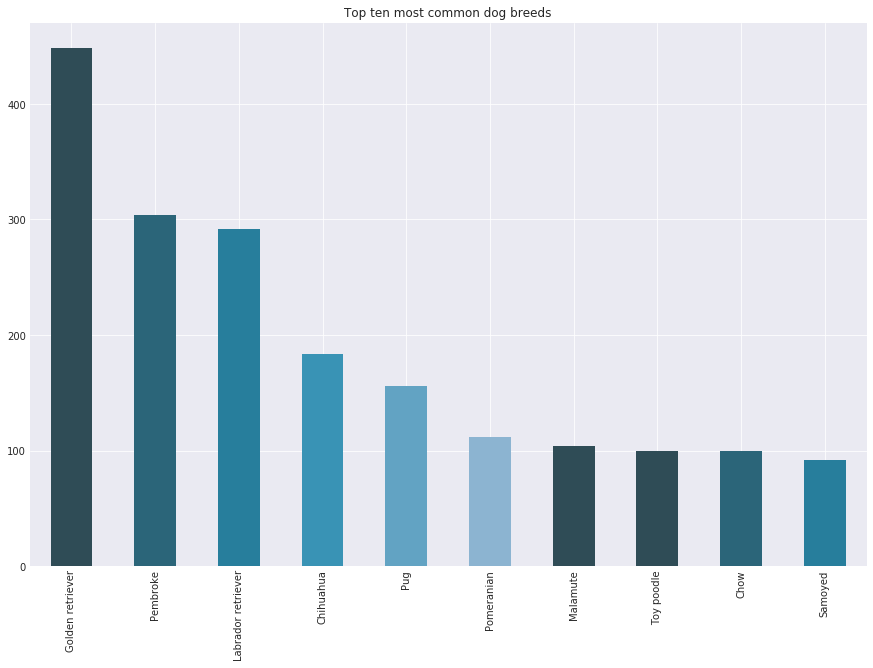

In [153]:
# Defining the size of the chart.

plt.figure(figsize=(15,10))

# Giving the chart a title

plt.title('Top ten most common dog breeds')

# Feeding in the variable from above to plot a bar chart. 

top_breed = twitter_archive_master['Breed Prediction 1'].value_counts()[:10].plot(kind='bar')

### Insight #2: What tweet was favorited the most?

In [162]:
# Finding the row with the highest favorite count in the 'favorite_count' column.

twitter_archive_master.loc[twitter_archive_master['favorite_count'].idxmax()]

Unnamed: 0                                                          413
tweet_id                                             822872901745569793
timestamp                                           2017-01-21 18:26:02
expanded_urls         https://twitter.com/dog_rates/status/822872901...
rating_numerator                                                     13
rating_denominator                                                   10
name                                                               None
Dog Rating                                                        doggo
retweet_count                                                     48265
full_text             Here's a super supportive puppo participating ...
favorite_count                                                   132810
display_text_range                                              [0, 87]
created_at                                          2017-01-21 18:26:02
jpg_url                 https://pbs.twimg.com/media/C2tugXLXgAAr

> With over thirteen thousand retweets, we can officially say that this doggo is a THE favorite!

### Insight #3: What tweet was retweeted the least?

In [155]:
# Finding the row with the lowest retweet count in 'retweet_count'.

twitter_archive_master.loc[twitter_archive_master['retweet_count'].idxmin()]

Unnamed: 0                                                         2339
tweet_id                                             666102155909144576
timestamp                                           2015-11-16 03:55:04
expanded_urls         https://twitter.com/dog_rates/status/666102155...
rating_numerator                                                     11
rating_denominator                                                   10
name                                                               None
Dog Rating                                                        doggo
retweet_count                                                        16
full_text             Oh my. Here you are seeing an Adobe Setter giv...
favorite_count                                                       81
display_text_range                                             [0, 128]
created_at                                          2015-11-16 03:55:04
jpg_url                 https://pbs.twimg.com/media/CT54YGiWUAEZ

> All doggos deserve more retweets! This one only had 81. 

### Visualization

4. What was the favorite count over time? At what point in time was the highest favorite count?
>
> <b>NOTE:</b> Even though the 'timestamp' column had already been seen to datetime, it wouldn't allow me to pass anything in on a plot without first converting it again. I don't know why this happened. I had already converted it in the cleaning phase.

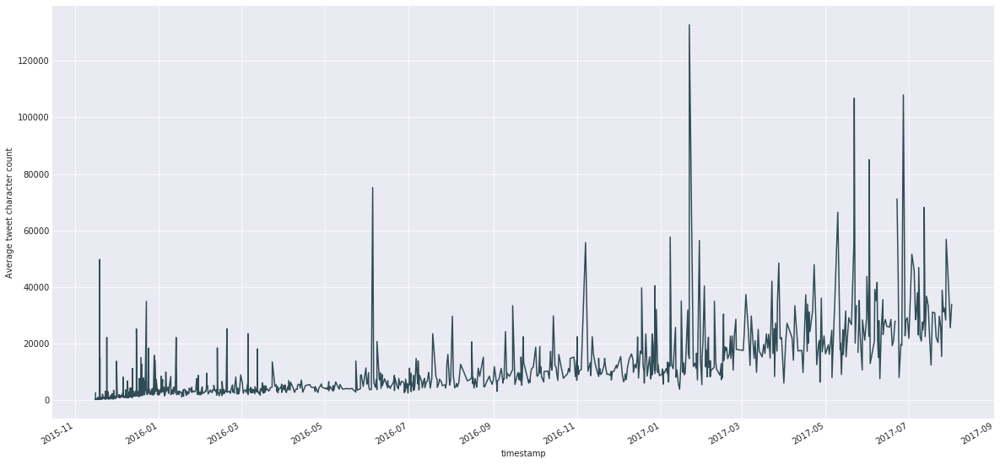

In [160]:
# Defining the chart size and background color.

plt.figure(figsize=(20,10))
sns.set_style("darkgrid")

# Giving the chart labels.

plt.xlabel('Nov 15th 2015-August 8th 2017')
plt.ylabel('Average tweet character count')

# Converting the column to datetime, see the note above for an explanation.

twitter_archive_master['timestamp'] = pd.to_datetime(twitter_archive_master['timestamp'])

# Visualizing by groupby() with 'timestamp' and 'favorite count'.

twitter_archive_master.groupby(twitter_archive_master['timestamp'])['favorite_count'].max().plot()

> We can see that there is an upward trend overtime people 'favoriting' a tweet. In Feburuary the favorite count reached over 12,000!